# Project

## GISTEMP Data

We have already dowloaded and preprocessed the data for this project, which can be found in the data subdirectory.  However if you wish to explore the raw data and the software used to process it then download [gistemp4.0.tar.gz](https://data.giss.nasa.gov/gistemp/sources_v4/gistemp4.0.tar.gz) from the [GISS Surface Temperature Analysis](https://data.giss.nasa.gov/gistemp/sources_v4/) website.  The website and archive contain instructions on how to install and run the Python code.  

If you choose to run GISTEMP, while running if you receive an error regarding a missing file, namely: gistemp4.0/tmp/input/Ts.strange.v4SCAR.list.IN_full, this is because the authors have a typo in gistemp4.0/steps/read_config.py.  The letters SCAR should not be in the file name.  You can either correct the read_config.py source code or change the file name gistemp4.0/tmp/input/Ts.strange.v4SCAR.list.IN_full to gistemp4.0/tmp/input/Ts.strange.v4.list.IN_full. 

## Installing Required Packages

For this project we will be using several modules, some of which are not included in a standard installation of Python and/or Anaconda.

For Linux and Mac users the following instructions can be performed in any shell of your choosing.  For Windows users the instructions are written for use in the `Anaconda Powershell Prompt (anaconda3)` application.

We will use the conda package installer to help us acquire and install necessary packages.  One could also use pip the Python Package Installer, but the instructions below will only be given for conda.  A common error made by those new to anaconda and/or python is to install pacakges using the wrong pacakge manager, as there may be multiple versions of conda, python etc on their system.  Before installing the packages below be sure to first identify the correct conda (or pip).  For Linux and Mac we will assume that Anaconda was installed locally in your home directory and the bin directory is located at `~/opt/anaconda3/bin/` (Verify the location on your system in the event your installation/setup is different).  For Windows users we will assume you are using the `Anaconda Powershell Prompt (anaconda3)` application.  The instructions below assume that the correct conda can be found in your path, however you can always use the full or relative path for your system (e.g. `~/opt/anaconda3/bin/conda`).

**WARNING:** At the time of writing conda does not have the BaseMap or Gurobi packages for Python 3.8 or higher.  If you used the links to the Anaconda installers that we provided at the begining of the course then you should have Python 3.7.6 installed.  In the event that you upgraded or are using Python 3.8 from some other installation you will need to install BaseMap and/or Gurobi from source or downgrade to Python 3.7.7 or earlier.

Install the following packages before attempting to complete project.


### CVX

1. (Windows Only) This package requires the [Visual Studio build tools for Python 3](https://visualstudio.microsoft.com/thank-you-downloading-visual-studio/?sku=BuildTools&rel=16).  Download and install the package.  Then modify the Visual Studio Build Tools in the `Workloads` tab by clicking the checkbox for `C++ build tools` and then clicking the install/modify button in the bottom right corner of the window.  See [instructions from cvxpy.org](https://drive.google.com/file/d/0B4GsMXCRaSSIOWpYQkstajlYZ0tPVkNQSElmTWh1dXFaYkJr/view).

1. conda install -c conda-forge cvxpy


### BaseMap


BaseMap may not be found in using pip, so we use conda.  This may take several attempts by conda, which is fine.  It will likely prompt you concerning the installation of a few dependencies (geos, proj4, ...) which should be installed.

1. `conda install basemap`




### Gurobi Solver (optional)

1. Acquire an academic license from the [Gurobi](https://www.gurobi.com) website.  See the [Academic License](https://www.gurobi.com/academia/academic-program-and-licenses/) page for instructions on downloading and installing the Gurobi Optimizer on your system.

1. `conda config --add channels http://conda.anaconda.org/gurobi`

1. `conda install gurobi`










## Potential Import Error

The BaseMap module may need some help to find epsg (and other files on your system) depending on your setup.  If you see something similar to the following:

```
---------------------------------------------------------------------------
KeyError                                  Traceback (most recent call last)
<ipython-input-1-640c5efdffd2> in <module>
      8 
----> 9 from mpl_toolkits.basemap import Basemap, addcyclic, shiftgrid
     10 


~/opt/anaconda3/lib/python3.7/site-packages/mpl_toolkits/basemap/__init__.py in <module>
    153 
    154 # create dictionary that maps epsg codes to Basemap kwargs.
--> 155 pyproj_datadir = os.environ['PROJ_LIB']
    156 epsgf = open(os.path.join(pyproj_datadir,'epsg'))
    157 epsg_dict={}

~/opt/anaconda3/lib/python3.7/os.py in __getitem__(self, key)
    676         except KeyError:
    677             # raise KeyError with the original key value
--> 678             raise KeyError(key) from None
    679         return self.decodevalue(value)
    680 

KeyError: 'PROJ_LIB'
```

## Imports

In [2]:
import pandas as pd
import numpy as np

# Optimization
import cvxpy as cp

# Plotting
import matplotlib.pyplot as plt

import os
#os.environ["PROJ_LIB"] = "C:\\Utilities\\Python\\Anaconda\\Library\\share"
os.environ["PROJ_LIB"] = "C:\ProgramData\Anaconda3\pkgs\proj4-5.2.0-ha925a31_1\Library\share" 


try:
    from mpl_toolkits.basemap import Basemap, addcyclic, shiftgrid
except KeyError:
    print('**************************************************************')
    print('Find the path to the file epsg in your anaconda installation.')
    print('This is likely in a path similar to ".../anaconda3/share/proj"')
    print('  or ".../anaconda3/share/proj4".')
    print('Use the full path to this folder to save some headache.')
    print('Uncomment the os.environ line prior to the import and modify ')
    print('  the path for your setup.')
    print('*************************************************************')
    raise

    

## Helper Functions

The following code block contains functions for loading data, creating grids and plotting.

In [3]:

def load_GISTEMP_step_data(file):
    """
    Loads the GISTEMP station temperature data file.
    file - The path and file name of the station temperature data file to be loaded.
    Returns - A Pandas DataFrame with MultiIndex containing the station ID and years of
        operation, and columns containing the mean temperature recorded at each
        station during the month (column) and year (row).
    """
    df = pd.read_fwf(file, 
                     colspecs=[(  0 , 11 ), # ID
                               ( 11 , 15 ), # Year
                               ( 19 , 24 ), # Jan
                               ( 27 , 32 ), # Feb
                               ( 35 , 40 ), # Mar
                               ( 43 , 48 ), # Apr
                               ( 51 , 56 ), # May
                               ( 59 , 64 ), # Jun
                               ( 67 , 72 ), # Jul
                               ( 75 , 80 ), # Aug
                               ( 83 , 88 ), # Sep
                               ( 91 , 96 ), # Oct
                               ( 99 , 104 ),# Nov
                               ( 107 , 112 )# Dec
                              ],
                     names=['ID',
                            'Year',  
                            'January', 
                            'February',
                            'March', 
                            'April', 
                            'May', 
                            'June',
                            'July', 
                            'August',
                            'September',
                            'October', 
                            'November',
                            'December',
                           ],
                     index_col=[0,1])
    
    # replace the fill value (-9999) with np.nan
    df.where(df != -9999, other=np.nan, inplace=True)
    # convert to degrees Celcius
    df /= 100 

    return df


def load_GISTEMP_step_inv(file):
    """
    Loads the GISTEMP inventory file.
    file - The path and file name of the inventory file to be loaded.
    Returns - A Pandas DataFrame containing the latitude, longitude and station 
        name (columns), and indexed by the station ID's (rows).
    """
    # Read the station inventory - this provides GPS locations and names for each station
    inv_df = pd.read_fwf(file,                         
                         colspecs=[(  0 , 11 ), # ID
                                   ( 12 , 20 ), # Latitude
                                   ( 21 , 30 ), # Longitude
                                   ( 38 , 68 )  # Station Name
                                  ],
                         names=['ID', 
                                'lat',  
                                'lon', 
                                'name'
                               ],
                         index_col=0)

    return inv_df

    
def create_hansen_grid_80():
    """
    Creates a grid of approximately equal area 'boxes' around the globe.
    Hansen, J.E., and S. Lebedeff, 1987: Global trends of measured surface air 
    temperature. J. Geophys. Res., 92, 13345-13372, doi:10.1029/JD092iD11p13345.
    
    Returns - A list of lists.  The returned list contains 80 such sublists (boxes)
        of nearly equal surface area according to Hansen et al.  Each sublist 
        represents the north & south latitude, west & east longitude respectively.  
    """
    
    # North / South latitudes of the bands
    band_lats = 180 / np.pi * np.arcsin([1, 0.9, 0.7, 0.4, 0])
    
    # The number of boxes in each band around the globe, 4 at the poles and 16 
    # at the equator
    band_boxes = [4, 8, 12, 16]
    
    boxes = []
    for band_idx, num_band_boxes in enumerate(band_boxes):        
        for box_idx in range(num_band_boxes):
            
            # Northern Box
            n_box = [band_lats[band_idx],                         # north lat
                     band_lats[band_idx + 1],                     # south lat
                     -180 + 360 * box_idx / num_band_boxes,       # west lon
                     -180 + 360 * (box_idx + 1) / num_band_boxes  # east lon
                    ]
            # Southern Box
            s_box = [-n_box[1],
                     -n_box[0],
                     n_box[2],
                     n_box[3]
                    ]
            boxes.append(n_box.copy())
            boxes.append(s_box.copy())
    return boxes


def create_texas_grid(grid_size=9):
    """
    Creates a 'square' grid approximately enclosing the state of Texas.
    grid_size - The number of grid lines in each direction to be equally 
        distributed in latitude and longitude.  The number of boxes in each
        direction is equal to grid_size-1.
    Returns - A list of lists.  The returned list contains (grid_size-1)**2 sublists
        (boxes) equally distributed, with respect to latitude and longitude between
        25.75 and 36.5 degrees latitude, and between -106.75 and -93.5 degrees
        longitude, approximately enclosing the state of Texas.  Each sublist 
        represents the north & south latitude, west & east longitude respectively.  
    """
    lon_stops = np.linspace(-106.75, -93.5, num=grid_size)
    lat_stops = np.linspace(25.75, 36.5, num=grid_size)

    texas_boxes = []
    for lat_idx in range(len(lat_stops)-1):

        for lon_idx in range(len(lon_stops)-1):
            texas_boxes.append([lat_stops[lat_idx+1],# north
                                lat_stops[lat_idx],  # south
                                lon_stops[lon_idx],  # west
                                lon_stops[lon_idx+1] # east
                               ])
    return texas_boxes


def plot_gps_locations_world(lat, lon, title='Station Locations', boxes=None, create_fig=True, temp=None):
    """
    Plots the station positions and optional grid on the world map.
    lat - The latitudes (in degrees) of each station to be plotted.  Each value
        is expected to be in the range [-90, 90], where 90 degrees is the north
        pole and -90 degrees is the south pole.
    lon - The longitudes (in degrees) of each station to be plotted.  Each value
        is expected to be in the range [-180, 180], where 0 degrees is the Prime
        Meridian with west negative and east positive from 0.
    title - A string to be displayed as the title of the plot.
    boxes - If boxes is None then no grid will be drawn.  If boxes is not None
        then it is expected to be an iterable whose elements are lists containing
        four values representing the north and south latitudes and west and east
        longitudes, in that order.
    create_fig - If fig is True then a new figure will be created for the plot, 
        otherwise no figure will be created for the plot.
    temp - If None all locations are drawn in red.  Otherwise, temp is expected
        to contain a numeric value for each location (lat,lon) and will be used
        to color that location using the colormap RdYlBu_r; clamped to the range
        [-45, 45].
    """
    if create_fig:
        fig = plt.figure(figsize=(10, 8))
    m = Basemap(projection='robin', llcrnrlat=-90, urcrnrlat=90,
                llcrnrlon=0, urcrnrlon=360, resolution='c', lon_0=0)

    m.drawmapboundary()
    m.drawcoastlines(color='lightgray')
    if boxes is not None:
        for box in boxes:
            x,y = m([box[2], box[3], box[3], box[2], box[2]], 
                    [box[0], box[0], box[1], box[1], box[0]])
            m.plot(x, y, color='k')

    x,y = m(lon.to_list(), lat.to_list())
    if temp is None:
        m.scatter(x, y, marker='D',color='r', s=1)
    else:
        cm = plt.cm.get_cmap('RdYlBu_r')
        sc = m.scatter(x, y, c=temp, marker='D', s=1, cmap=cm)
        plt.colorbar(sc, label='Temperature (°C)', orientation='horizontal');  
        plt.clim(-45,45) # artificially clamp the colorbar to a fixed range
        
    plt.title(title)


def plot_gps_locations_texas(lat, lon, title='Texas Station Locations', boxes=None, 
                             marker_location=None, create_fig=True):
    """
    Plots the station positions and optional grid on the map of Texas.
    lat - The latitudes (in degrees) of each station to be plotted.  Each value
        is expected to be in the range [-90, 90], where 90 degrees is the north
        pole and -90 degrees is the south pole.
    lon - The longitudes (in degrees) of each station to be plotted.  Each value
        is expected to be in the range [-180, 180], where 0 degrees is the Prime
        Meridian with west negative and east positive from 0.
    title - A string to be displayed as the title of the plot.
    boxes - If boxes is None then no grid will be drawn.  If boxes is not None
        then it is expected to be an iterable whose elements are lists containing
        four values representing the north and south latitudes and west and east
        longitudes, in that order.
    marker_location - If None no marker is plotted.  Otherwise this is expected
        to be a tuple containing the latitude and longitude of a single position
        that will be drawn as a black x on the map.
    create_fig - If fig is True then a new figure will be created for the plot, 
        otherwise no figure will be created for the plot.
    """
    if create_fig:
        fig = plt.figure(figsize=(10, 8))

    m = Basemap(llcrnrlon=-107,llcrnrlat=24,urcrnrlon=-92,urcrnrlat=38,
                projection='lcc',lat_1=33,lat_2=45,lon_0=-95)

    # Texas Shapefile http://gis-txdot.opendata.arcgis.com/datasets/texas-state-boundary/data
    m.readshapefile('Texas_State_Boundary-shp/State', name='texas', drawbounds=True)

    m.etopo()
    if boxes is not None:
        for box in boxes:
            x,y = m([box[2], box[3], box[3], box[2], box[2]], 
                    [box[0], box[0], box[1], box[1], box[0]])
            m.plot(x, y, color='k')

    x,y = m(lon.to_list(), lat.to_list())
    m.scatter(x, y, marker='D',color='r', s=16)

    if marker_location is not None:
        marker_x,marker_y = m(marker_location[1], marker_location[0])
        m.scatter(marker_x, marker_y, marker='x',color='k', s=40)

    plt.title(title)
    plt.show()
    
    

## Load Temperature Data

The following block loads the processed GISTEMP data, and organizes it using a Pandas DataFrame. 

In [4]:
gistemp_file = 'data/step0.v4'

gistemp_df = load_GISTEMP_step_data(gistemp_file)
gistemp_df


January  February  March  April    May   June   July  \
ID          Year                                                         
ACW00011604 1961    -0.85      2.40   4.76   7.77  11.32  16.03  15.74   
            1962     1.17      0.89  -1.50   6.39   9.12  13.85  15.14   
            1963    -7.09     -5.49  -0.95   5.45  12.28  16.31  16.24   
            1964     0.66     -0.81   0.59   7.42  12.23  14.46  15.10   
            1965     0.48     -1.01   0.42   5.94   9.91  15.04  14.91   
...                   ...       ...    ...    ...    ...    ...    ...   
ZIXLT622116 1966    21.80     20.40  18.40  16.90  14.30  12.80  12.10   
            1967    21.10     19.90  18.90  19.20  15.10  13.50  11.00   
            1968    21.80     20.00  19.30  18.20  15.60  10.80  13.70   
            1969    20.90     21.50  19.50  18.30  14.10  13.10  11.60   
            1970    20.70     19.90  19.30  17.20  15.60  13.30  13.30   

                  August  September  October  November  December  
ID          Year                                                  
ACW00011604 1961   14.85      14.17    11.78      5.14     -0.35  
            1962   13.97      11.67     9.98      3.27     -1.22  
            1963   16.00      13.36     9.44      5.70     -1.04  
            1964   15.61      12.25     7.92      5.50      1.16  
            1965   14.81      13.81     9.78      0.35     -1.74  
...                  ...        ...      ...       ...       ...  
ZIXLT622116 1966   14.60      17.70    19.80     20.90     21.10  
            1967   13.80      16.60    20.80     19.90     19.10  
            1968   16.30      17.60    21.80     18.40     20.70  
            1969   14.60      17.80    21.00     20.40     19.10  
            1970   15.40      20.40    20.30     21.30     21.50  

[1304282 rows x 12 columns]

## Load Station Inventory

The following block loads the inventory of stations, and creates a Pandas DataFrame containing their positions and names.

In [5]:
gistemp_inv_file = 'data/v4.inv'

gistemp_inv_df = load_GISTEMP_step_inv(gistemp_inv_file)
gistemp_inv_df

,lat,lon,name
ID,,,
ACW00011604,57.7667,11.8667,SAVE
AE000041196,25.3330,55.5170,SHARJAH_INTER_AIRP
AEM00041184,25.6170,55.9330,RAS_AL_KHAIMAH_INTE
AEM00041194,25.2550,55.3640,DUBAI_INTL
AEM00041216,24.4300,54.4700,ABU_DHABI_BATEEN_AIR
...,...,...,...
ZI000067983,-20.2000,32.6160,CHIPINGE
ZI000067991,-22.2170,30.0000,BEITBRIDGE
ZIXLT371333,-17.8300,31.0200,HARARE_BELVEDERE


## Compute Monthly Means


In [6]:

def compute_monthly_temperature_means(df, begin_year=None, end_year=None):
    """
    Computes the mean temperature of every column (month) in the passed DataFrame, df,
    in the range [begin_year, end_year], inclusive.  The passed DataFrame is expected
    to contain a MultiIndex in which the first level is the station ID, and the second
    level contains the set of years during which the corresponding station was in 
    service.  The mean temperatures are given per column for all stations operating
    wholly or partially within the given range [begin_year, end_year].
    begin_year - The first year to be included in the mean.  If begin_year is None
        then the first available year in the data is used.  All stations in service
        during this year or after (but not after end_year) are inlcuded in the means.
    end_year - The last year to be included in the mean.  If end_year is None
        then the last available year in the data is used.  All stations in service
        during this year or before (but not before begin_year) are inlcuded in the means.
    Returns - A Pandas Series containing the mean temperatures of the columns in 
        the DataFrame over the specified range of years.  The series name property will
        be set to 'monthly mean'.
    """
    if begin_year is None:
        if end_year is None:
            mean_temp = df.mean()           
        else:
            mean_temp = df.loc[pd.IndexSlice[:,:end_year],:].mean()
    else:
        if end_year is None:
            mean_temp = df.loc[pd.IndexSlice[:,begin_year:],:].mean()
        else:
            mean_temp = df.loc[pd.IndexSlice[:,begin_year:end_year],:].mean()
    
    mean_temp.name = 'monthly mean'
    return mean_temp


## Test Code

In [7]:
print('::: Global Monthly Mean - All Time :::')
print(compute_monthly_temperature_means(gistemp_df))

print('\n::: Global Monthly Mean - 1951-1980 :::')
print(compute_monthly_temperature_means(gistemp_df, 1951, 1980))

::: Global Monthly Mean - All Time :::
January       0.839038
February      2.250228
March         5.954915
April        10.515124
May          14.832612
June         18.445347
July         20.597414
August       19.998515
September    16.763987
October      11.937828
November      6.454189
December      2.248589
Name: monthly mean, dtype: float64

::: Global Monthly Mean - 1951-1980 :::
January       0.527798
February      2.207161
March         5.778525
April        10.545760
May          14.843142
June         18.435053
July         20.454341
August       19.838046
September    16.678704
October      12.049702
November      6.599356
December      2.362391
Name: monthly mean, dtype: float64


## Compute Annual Means


In [8]:

def compute_annual_temperature_means(df, begin_year=None, end_year=None):
    """
    Computes the mean annual temperature of all stations in every year in the passed 
    DataFrame, df, in the range [begin_year, end_year], inclusive.  The passed DataFrame 
    is expected to contain a MultiIndex in which the first level is the station ID, and 
    the second level contains the set of years during which the corresponding station 
    was in service.  The mean annual temperature is computed in two steps:
      1) The monthly mean is computed from all stations operating in each year with the
         passed range [begin_year, end_year].  The result of this step alone is a 
         DataFrame where each row correpsonds to a single year, and each column 
         corresponds to a single month.  The values stored in the DataFrame are the the
         mean temperatures from all stations operating during the given month and year.
      2) The annual mean is computed by the naive mean of all rows in the result of the 
         first step.
    begin_year - The first year to be included in the mean.  If begin_year is None
        then the first available year in the data is used.  All stations in service
        during this year or after (but not after end_year) are inlcuded in the means.
    end_year - The last year to be included in the mean.  If end_year is None
        then the last available year in the data is used.  All stations in service
        during this year or before (but not before begin_year) are inlcuded in the means.
    Returns - A Pandas Series containing the mean temperatures of the columns in 
        the DataFrame over the specified range of years.  The year indices in the returned
        Series should be sorted in ascending order (small to large). The series name 
        property will be set to 'annual mean'.
    """
    if begin_year is None:
        if end_year is None:
            mean_temp = df.droplevel(0).groupby('Year').mean()           
        else:
            mean_temp = df.loc[pd.IndexSlice[:,:end_year],:].droplevel(0).groupby('Year').mean()
    else:
        if end_year is None:
            mean_temp = df.loc[pd.IndexSlice[:,begin_year:],:].droplevel(0).groupby('Year').mean()
        else:
            mean_temp = df.loc[pd.IndexSlice[:,begin_year:end_year],:].droplevel(0).groupby('Year').mean()
    annual_mean = mean_temp.mean(axis=1)
    annual_mean.name = 'annual mean'
    return annual_mean
    



## Test Code

In [9]:
print('::: Global Annual Mean - All Time :::')
print(compute_annual_temperature_means(gistemp_df, None, None))

print('\n::: Global Annual Mean - 1951-1980 :::')
print(compute_annual_temperature_means(gistemp_df, 1951, 1980))

::: Global Annual Mean - All Time :::
Year
1880    11.177930
1881    10.804932
1882    10.962864
1883    10.435851
1884    10.490708
          ...    
2016    11.896976
2017    11.754706
2018    11.441346
2019    11.260184
2020    10.061704
Name: annual mean, Length: 141, dtype: float64

::: Global Annual Mean - 1951-1980 :::
Year
1951    11.014126
1952    11.410396
1953    11.932862
1954    11.573105
1955    11.228615
1956    11.110273
1957    11.359854
1958    11.267679
1959    11.175171
1960    10.869157
1961    11.179747
1962    10.931295
1963    10.992642
1964    10.849817
1965    10.783680
1966    10.759822
1967    10.926389
1968    10.736474
1969    10.459527
1970    10.541580
1971    10.642780
1972    10.578157
1973    10.976108
1974    10.710198
1975    10.702695
1976    10.233508
1977    10.809016
1978    10.296765
1979    10.390325
1980    10.552545
Name: annual mean, dtype: float64


## Identify Operating Stations

In [10]:

def get_operating_stations_by_year(df, begin_year=None, end_year=None):
    """
    Creates and returns a Pandas Index containing the unique set of station id's
    for all stations operating between begin_year and end_year inclusive.  The 
    included stations are those that have at least on non-NaN entry during at 
    least one month in any year (not necessarily all years) within the passed 
    range of years.
    df - A Pandas DataFrame with MultiIndex containing the station ID and years of
        operation, and columns containing the mean temperature recorded at each
        station during the month (column) and year (row).
    begin_year - The first year to be included.  If begin_year is None then the 
        first available year in the data is used.  All stations in service during 
        this year or after (but not after end_year) are inlcuded in the set of 
        returned station ids.
    end_year - The last year to be included.  If end_year is None then the last 
        available year in the data is used.  All stations in service during this 
        year or before (but not before begin_year) are inlcuded in the set of 
        returned station ids.
    Returns - A Pandas Index containing the ids of all operating stations in the
        given range of years.  The name property of the Index set will be set to 
        'ID'.
    """
    if begin_year is None:
        if end_year is None:
            stations = df.dropna(how = 'all').index.unique(level=0)
        else:
            stations = df.loc[pd.IndexSlice[:,:end_year],:].dropna(how = 'all').index.unique(level=0)
    else:
        if end_year is None:
            stations = df.loc[pd.IndexSlice[:,begin_year:],:].dropna(how = 'all').index.unique(level=0)
        else:
            stations = df.loc[pd.IndexSlice[:,begin_year:end_year],:].dropna(how = 'all').index.unique(level=0)
    return stations
    


def get_operating_stations_by_month(df, month, begin_year=None, end_year=None):
    """
    Creates and returns a Pandas Index containing the unique set of station id's
    for all stations operating between begin_year and end_year inclusive, and have 
    valid (non-NaN) data during the given month (not necessarily in all years).  
    df - A Pandas DataFrame with MultiIndex containing the station ID and years of
        operation, and columns containing the mean temperature recorded at each
        station during the month (column) and year (row).
    month - A string from the set of column names (months) in df.  Only stations
        with valid (non-NaN) data during this month will be included in the returned
        Pandas Index.
    begin_year - The first year to be included.  If begin_year is None then the 
        first available year in the data is used.  Stations in service during 
        this year or after (but not after end_year) with valid data during month
        are inlcuded in the set of returned station ids.
    end_year - The last year to be included.  If end_year is None then the last 
        available year in the data is used.  Stations in service during this year 
        or before (but not before begin_year) with valid data during month are
        inlcuded in the set of returned station ids.
    Returns - A Pandas Index containing the ids of all operating stations in the
        given range of years with valid data in month.  The name property of the 
        Index set will be set to 'ID'.
    """
    if begin_year is None:
        if end_year is None:
            stations = df[month].dropna().index.get_level_values(0).unique(level=0)
        else:
            stations = df[month].dropna().loc[:,:end_year].index.unique(level=0)
    else:
        if end_year is None:
            stations = df[month].dropna().loc[:,begin_year:].index.unique(level=0)
        else:
            stations = df[month].dropna().loc[:,begin_year:end_year].index.unique(level=0)
    
    return stations



## Get Station Locations

In [11]:

def get_station_locations(inv_df, stations=None):
    """
    Returns the positions of the set of passed stations.
    as Pandas Series of the 
    columnes named lat_colname and lon_colname from the DataFrame df for the
    set of stations in operation between begin_year and end_year, inclusive.  
    inv_df - A Pandas DataFrame containing the latitude and longitude 
        (columns), and indexed by the station ID's.
    stations - A Pandas Series of station ID's that should be found in inv_df
        and their positions returned. If stations is None then all station
        locations in the inventory should be returned.
    Returns - A tuple containing the latitudes and longitudes of the set of
        stations found in both stations and inv_df.  Both the latitudes and
        longitudes are represented as Pandas Series.  The series name 
        property for the returned Series will be set to their respective 
        column names in inv_df.
    """
    if stations is None:
        station_locations = (inv_df['lat'], inv_df['lon'])
    else:
        station_locations = (inv_df.loc[stations]['lat'], inv_df.loc[stations]['lon'])
    return station_locations
        



## Test Code


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:164: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


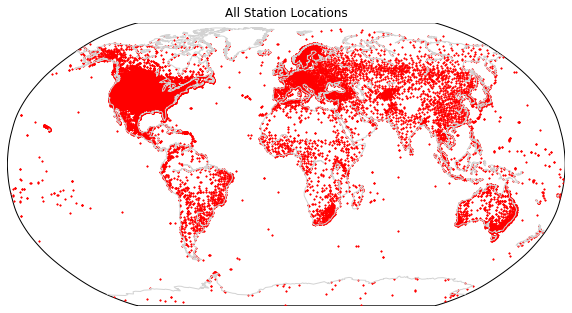

In [12]:

stations = get_operating_stations_by_year(gistemp_df)
lat, lon = get_station_locations(gistemp_inv_df, stations)

plot_gps_locations_world(lat, lon, title='All Station Locations')


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:164: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


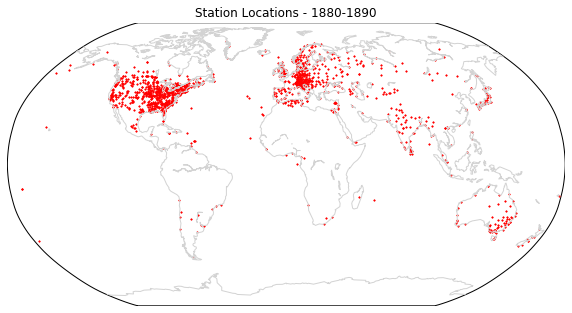

In [13]:

begin_year = 1880
end_year = 1890

stations = get_operating_stations_by_year(gistemp_df, begin_year, end_year)
lat, lon = get_station_locations(gistemp_inv_df, stations)

plot_gps_locations_world(lat, lon, title=f'Station Locations - {begin_year}-{end_year}')



In [14]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.animation
from IPython.display import HTML
import warnings
warnings.filterwarnings('ignore')

# Modify the following values to affect which stations are displayed
month = None
begin_year = 1880
end_year = 2020



fig = plt.figure(figsize=(10, 5))

m = Basemap(projection='robin', llcrnrlat=-90, urcrnrlat=90,
            llcrnrlon=0, urcrnrlon=360, resolution='c', lon_0=0)

m.drawmapboundary()
m.drawcoastlines(color='lightgray')

scat_obj = None

def animate_station_locations(frame_idx, m, month, begin_year, end_year, df, inv_df):
    """
    Draws the locations of the station identified using `get_operating_stations_by_year`dd
    or `get_operating_stations_by_month`.  Any previous draw (as identified by scat_obj)
    is removed.
    """
    global scat_obj
    year = 1880+frame_idx
    if month is None:
        stations = get_operating_stations_by_year(df, year, year)
        plt.title(f'Station Locations ({year})')
    else:
        stations = get_operating_stations_by_month(df, month, year, year)
        plt.title(f'Station Locations ({month} {year})')

    lat, lon = get_station_locations(inv_df, stations)
    #lat = inv_df.loc[stations]['lat']
    #lon = inv_df.loc[stations]['lon']
    if scat_obj is not None:
        scat_obj.remove()
    x,y = m(lon.to_list(), lat.to_list())
    scat_obj = m.scatter(x, y, marker='D',color='r', s=1)
    if year >= end_year:
        plt.close() # prevents the additional plot display in notebook outside of the animation


def init():
    pass


# Create the animation
ani = matplotlib.animation.FuncAnimation(fig, 
                                         animate_station_locations,
                                         frames=end_year-begin_year+1, 
                                         fargs=(m,
                                                month,
                                                begin_year,
                                                end_year,
                                                gistemp_df,
                                                gistemp_inv_df),
                                         init_func=init)
# Generate HTML representation of the animation
HTML(ani.to_jshtml())



## Temperature Data Access

In [15]:

def get_valid_station_temps_by_month(df, month, year):
    """
    Creates and returns a np.array containing the valid temperatures from all
    stations operating during year, and have valid (non-NaN) data during the given
    month.  The order of the temperature values in the returned array matches the
    order of station ids given by get_operating_stations_by_month for the same month
    and year (single year, not range of years).
    df - A Pandas DataFrame with MultiIndex containing the station ID and years of
        operation, and columns containing the mean temperature recorded at each
        station during the month (column) and year (row).
    month - A string from the set of column names (months) in df.  Only stations
        with valid (non-NaN) data during this month will be included in the array 
        of temperatures returned.
    year - Numeric value representing a year from df.  Stations in service during 
        this year with valid data during month are inlcuded in the set of 
        temperatures returned.
    Returns - A np.array containing the ids of all operating stations in the
        given range of years with valid data in month.
    """
    stations = df[month].dropna().loc[:,year]
    return stations

    
def get_valid_station_temps_by_year(df, year):
    """
    Creates and returns a np.array containing the mean annual temperatures from all
    stations operating during year.  The order of the annual mean temperature in 
    the returned array matches the order of station ids given by 
    get_operating_stations_by_year for the same year (single year, not range of
    years).
    df - A Pandas DataFrame with MultiIndex containing the station ID and years of
        operation, and columns containing the mean temperature recorded at each
        station during the month (column) and year (row).
    year - Numeric value representing a year from df.  Stations in service during 
        this year with valid data are inlcuded in the set of annual means returned.
    Returns - A np.array containing the annual mean temperatures from all operating
        stations in the given year.
    """
    station_temp_by_year = df.loc[pd.IndexSlice[:,year],:].mean(axis=1).droplevel(1)
    return station_temp_by_year



## Test Code


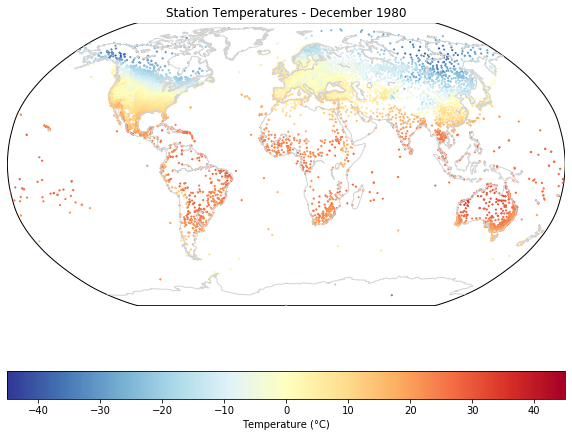

In [16]:

month = 'December'
year = 1980

station_temps = get_valid_station_temps_by_month(gistemp_df, month, year)

stations = get_operating_stations_by_month(gistemp_df, month, year, year)

lat, lon = get_station_locations(gistemp_inv_df, stations)

plot_gps_locations_world(lat, lon, temp=station_temps, title=f'Station Temperatures - {month} {year}')


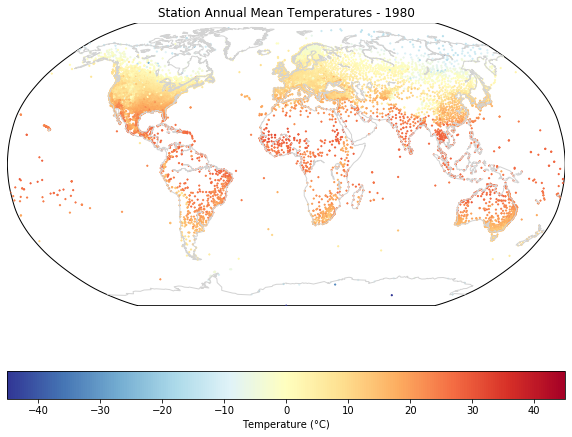

In [17]:
year = 1980

station_temps = get_valid_station_temps_by_year(gistemp_df, year)

stations = get_operating_stations_by_year(gistemp_df, year, year)

lat, lon = get_station_locations(gistemp_inv_df, stations)

plot_gps_locations_world(lat, lon, temp=station_temps, title=f'Station Annual Mean Temperatures - {year}')


## Minimization Setup - Global Quantity of Interest

The system matrix will have the number of rows equal to the number of basis functions, e.g. the number of cells (boxes) in our grid, and the number of columns equal to the number of measurements.  The values in this matrix will be either zero or one.  If an entry at (row, col) is one, then the measurement corresponding to col exists within the box corresponding to row.  The entries in the right hand side should be equal to the area of the grid cell (box) divided by the total surface area.  For the surface area of a grid cell (box) you can use the formula $\frac{\pi}{180} \cdot E^2 \cdot |sin(b_0) - sin(b_1)| \cdot |b_2 - b_3|$, where $E = 6375$km is an approximate radius of the Earth and $[b_0, b_1, b_2, b_3]$ are the north, south latitudes and west, east longitudes respectively.

The `box_contains` function will be helpful in your implementation of `setup_system_global_mean_pwc` and `setup_system_location_mean_pwc` later in the project.  The function simply returns True if the passed latitude and longitude are "within" the box and False otherwise.  A lat,lon pair is within a box if south < lat <= north and west < lon <= east.  Do note that with this test we exclude any station that is located at the south pole, which we will ignore for this project.

In [18]:

def box_contains(box, lat, lon):
    """
    Checks if the passed latitude and longitude are contained in box.
    box - A lists containing four values representing the north and south
        latitudes and west and east longitudes, in that order, of the box
        boundary.
    lat - The latitude (in degrees) that is to be tested against box.  This
        value is expected to be in the range [-90, 90], where 90 degrees is 
        the north pole and -90 degrees is the south pole.
    lon - The longitude (in degrees) that is to be tested against box.  This
        value is expected to be in the range [-180, 180], where 0 degrees is
        the Prime Meridian with west negative and east positive from 0.
    Returns - True if (lat, lon) exists within (including all boundaries) the 
        specified box.
    Note that a lat,lon pair is within box if south < lat <= north and 
        west < lon <= east.  Also, with this test we exclude any station that
        is located at the south pole, which we will ignore for this project.
    """
    if lat <= box[0] and lat > box[1] and lon <= box[3] and lon > box[2]:
        return True    
    else:
        return False


def setup_system_global_mean_pwc(station_lats, station_lons, boxes=None):
    """
    Given a set of latitudes and longitudes this function creates a matrix whose 
    rows represent a piecewise constant basis, and columns represent the set of
    (lat, lon) pairs given by zip(station_lats, station_lons).  The function also
    creates the correponding righthand side for the global mean.
    station_lats - The latitudes (in degrees) of each station to be considered in
        the optimization.  Each value is expected to be in the range [-90, 90], 
        where 90 degrees is the north pole and -90 degrees is the south pole.
    station_lons - The longitudes (in degrees) of each station to be considered in
        the optimization.  Each value is expected to be in the range [-180, 180],
        where 0 degrees is the Prime Meridian with west negative and east positive
        from 0.
    boxes - If boxes is None then the `create_hansen_grid_80()` will be used to 
        create the world grid from which the piecewise constant basis will be 
        generated.  If boxes is not None then it is expected to be an iterable
        whose elements are lists containing four values representing the north and
        south latitudes and west and east longitudes, in that order.
    Returns - A tuple (B,c) containing the system matrix, B, and the right hand 
        side, c.  B will have shape (len(boxes), len(station_lats)), and c will
        have shape (len(boxes), 1).
    """
    if boxes is None:
        boxes = create_hansen_grid_80()
    
    B = np.zeros((len(boxes),len(station_lats)))
    c = np.zeros((len(boxes),1))
    i=0
    for box in boxes:
        j=0
        for lat,lon in zip(station_lats,station_lons):
            B[i][j] = int(box_contains(box,lat,lon))
            j+=1
        c[i] = abs(np.sin(box[0]*(np.pi)/180)-np.sin(box[1]*(np.pi)/180))*abs(box[2] - box[3])
        i+=1
    c = c/sum(c)
    return (B,c)



## Minimzation

In [19]:

def optimize_weights_pwc(B, c, verbose=False):
    """
    This function implements the minimization from Algorithm 1 from the notes.  
    Given a set of latitudes and longitudes (x_1,...,x_m in the notes) this 
    function computes the weights, a_i, to be applied to the measurements, y_i, 
    when computing the weighted mean.  This function solves min_a Ba=c.
    B - An np.arrray with dimension (num_bases, num_observations) representing the 
        system matrix for the optimization.
    c - An np.array with dimension (num_bases, 1) representing the right-hand side.
    verbose - If True the function will output text giving information regarding 
        the progress of the optimization and results.
    Returns - A tuple containing the cp.Problem object used in the minimization,
        an np.array containing the weights a_i, and the value of the compatibility
        indicator mu.
    """
    rows = []
    for i in range(B.shape[0]):
        if max(B[i])>0:
            rows.append(i)
    B_modified = B[rows,:]
    c_modified = c[rows]
    a = cp.Variable(shape = (B_modified.shape[1],1))
    constraints = [B_modified@a == c_modified]
    prob = cp.Problem(cp.Minimize(cp.norm(a,1)),constraints)
    mu = prob.solve(solver = 'GUROBI',verbose = verbose)    
    return (prob,a.value,mu)



## Driver - Global Quantity of Interest

 This function will compute either the global mean temperature for a given month in a given year, or if month is None then it will compute the global annual mean temperature for the given year.  

In [33]:

def optimize_global_mean_pwc(df, inv_df, year, month=None, boxes=None, verbose=False):
    """
    Computes the global mean temperature from either the annual mean temperatures,
    or the monthly temperatures using the given station data and inventory.
    df - A Pandas DataFrame with MultiIndex containing the station ID and years of
        operation, and columns containing the mean temperature recorded at each
        station during the month (column) and year (row).
    inv_df - A Pandas DataFrame containing the latitude, longitude and station name.
    year - Numeric value representing a year from df.  Stations in service during 
        this year with valid data inlcuded in the optimization.
    month - A string from the set of column names (months) in df.  Only stations
        with valid (non-NaN) data during this month will be included in the returned
        Pandas Index.  If month is None then the annual mean for all stations will
        be computed first, and the optimzation run using annual means in place of
        monthly values.
    boxes - If boxes is None then the `create_hansen_grid_80()` will be used to 
        create the world grid from which the piecewise constant basis will be 
        generated.  If boxes is not None then it is expected to be an iterable
        whose elements are lists containing four values representing the north and
        south latitudes and west and east longitudes, in that order.
    verbose - If True the function will output text giving information regarding 
        the progress of the optimization and results.
    Returns - The global mean temperature for a given month,year or annually.
    """
    if month is None:
        y = df.loc[pd.IndexSlice[:,year],:].mean(axis=1).values
        stations = get_operating_stations_by_year(df,year,year)        
    else:
        y = df[month].dropna().loc[:,year].values  
        stations = get_operating_stations_by_month(df,month,year,year)    
    station_lats, station_lons = get_station_locations(inv_df, stations)
    B,c = setup_system_global_mean_pwc(station_lats, station_lons, boxes)
    prob,a,mu = optimize_weights_pwc(B,c,verbose)
    return (a.T@y)[0]
    


## Test Code

In [34]:
month = 'May'
year = 1961

global_mean = optimize_global_mean_pwc(gistemp_df, gistemp_inv_df, year, month, verbose=True)
print(f'Global Mean Temperature during {month} {year}: {global_mean}')

Parameter OutputFlag unchanged
   Value: 1  Min: 0  Max: 1  Default: 1
Changed value of parameter QCPDual to 1
   Prev: 0  Min: 0  Max: 1  Default: 0
Gurobi Optimizer version 9.0.2 build v9.0.2rc0 (win64)
Optimize a model with 23951 rows, 23877 columns and 71628 nonzeros
Model fingerprint: 0x6bdc11cd
Coefficient statistics:
  Matrix range     [1e+00, 1e+00]
  Objective range  [1e+00, 1e+00]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e-02]

Concurrent LP optimizer: dual simplex and barrier
Showing barrier log only...

Presolve removed 23881 rows and 81 columns
Presolve time: 0.12s
Presolved: 70 rows, 23796 columns, 23796 nonzeros

Ordering time: 0.00s

Barrier statistics:
 AA' NZ     : 0.000e+00
 Factor NZ  : 7.000e+01 (roughly 10 MBytes of memory)
 Factor Ops : 7.000e+01 (less than 1 second per iteration)
 Threads    : 1

Barrier performed 0 iterations in 0.14 seconds
Barrier solve interrupted - model solved by another algorithm


Solved with dual simplex
Solved in 0

## Comparison: Naive Mean vs Recovery

The following code blocks will compare the results of the naive mean and recovery using piecewise constants.  Note that the recovery optimization can take some time to complete for all years in the data set.

In [22]:

naive_means = compute_annual_temperature_means(gistemp_df).to_list()



In [23]:
begin_year = 1880
end_year = 2020
step = 1 # in your testing you may wish to increase the step size to save time

recovery_means = []
for year in range(begin_year, end_year+1, step):
    if year % 10 == 0:
        print(year)  # simple progress indicator
    try:
        annual_mean = optimize_global_mean_pwc(gistemp_df, gistemp_inv_df, year)
    except:
        annual_mean = np.NaN
        print(f'Optimization Failed - {year}')
    recovery_means.append(annual_mean)
    
    

1880
1890
1900
1910
1920
1930
1940
1950
1960
1970
1980
1990
2000
2010
2020


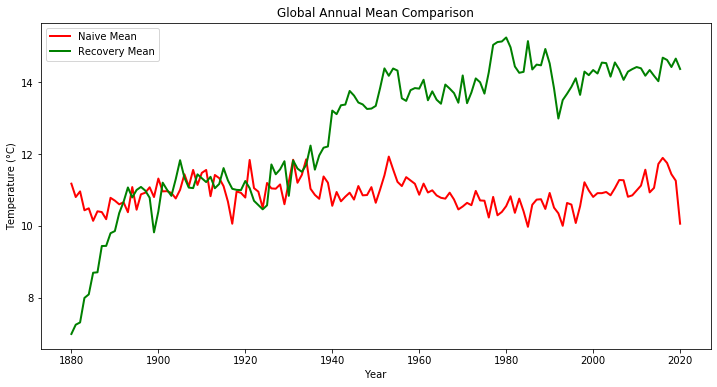

In [24]:

fig = plt.figure(figsize=(12, 6))
    
plt.plot(np.arange(begin_year, end_year+1, step), naive_means[::step], 'r', linewidth=2)
plt.plot(np.arange(begin_year, end_year+1, step), recovery_means, 'g', linewidth=2)

plt.legend(['Naive Mean', 'Recovery Mean'])

plt.xlabel('Year')
plt.ylabel('Temperature (°C)')
plt.title('Global Annual Mean Comparison')
plt.show()



## Minimization Setup - Local Quantity of Interest

In [25]:

def setup_system_location_mean_pwc(station_lats, station_lons, eval_location, boxes=None):
    """
    Given a set of latitudes and longitudes this function creates a matrix whose 
    rows represent a piecewise constant basis, and columns represent the set of
    (lat, lon) pairs given by zip(station_lats, station_lons).  The function also
    creates a right hand side for computing the mean temperature at the 
    eval_location.
    station_lats - The latitudes (in degrees) of each station to be considered in
        the optimization.  Each value is expected to be in the range [-90, 90], 
        where 90 degrees is the north pole and -90 degrees is the south pole.
    station_lons - The longitudes (in degrees) of each station to be considered in
        the optimization.  Each value is expected to be in the range [-180, 180],
        where 0 degrees is the Prime Meridian with west negative and east positive
        from 0.
    eval_location - A tuple or list containing the latitude and longitude of the
        location where the temperature should be evaluated.
    boxes - If boxes is None then the `create_hansen_grid_80()` will be used to 
        create the world grid from which the piecewise constant basis will be 
        generated.  If boxes is not None then it is expected to be an iterable
        whose elements are lists containing four values representing the north and
        south latitudes and west and east longitudes, in that order.
    Returns - A tuple (B,c) containing the system matrix, B, and the right hand 
        side, c.  B will have shape (len(boxes), len(station_lats)), and c will
        have shape (len(boxes), 1).
    """
    if boxes is None:
        boxes = create_hansen_grid_80()
    
    B = np.zeros((len(boxes),len(station_lats)))
    c = []
    i=0
    for box in boxes:
        j=0
        for lat,lon in zip(station_lats,station_lons):
            B[i][j] = int(box_contains(box,lat,lon))
            j+=1
        local_lat, local_lon = eval_location
        if box_contains(box,local_lat,local_lon):
            c.append(1)
        else:
            c.append(0) 
        i+=1
    
    c = np.array(c)
    c = c.reshape((c.shape[0],1))
    return (B,c)
    


## Driver - Local Quantity of Interest

In [31]:

def optimize_location_mean_pwc(df, inv_df, eval_location, year, month=None, boxes=None, verbose=False):
    """
    Computes the mean temperature evaluated at eval_location from either the annual
    mean temperatures, or the monthly temperatures using the given station data and 
    inventory.
    df - A Pandas DataFrame with MultiIndex containing the station ID and years of
        operation, and columns containing the mean temperature recorded at each
        station during the month (column) and year (row).
    inv_df - A Pandas DataFrame containing the latitude, longitude and station name.
    eval_location - A tuple containing the latitude and longitude where the mean
        temperature should be evaluated.
    year - Numeric value representing a year from df.  Stations in service during 
        this year with valid data inlcuded in the optimization.
    month - A string from the set of column names (months) in df.  Only stations
        with valid (non-NaN) data during this month will be included in the returned
        Pandas Index.  If month is None then the annual mean for all stations will
        be computed first, and the optimzation run using annual means in place of
        monthly values.
    boxes - If boxes is None then the `create_hansen_grid_80()` will be used to 
        create the world grid from which the piecewise constant basis will be 
        generated.  If boxes is not None then it is expected to be an iterable
        whose elements are lists containing four values representing the north and
        south latitudes and west and east longitudes, in that order.
    verbose - If True the function will output text giving information regarding 
        the progress of the optimization and results.
    Returns - The mean temperature evaluated at eval_location.
    """
    if month is None:
        y = df.loc[pd.IndexSlice[:,year],:].mean(axis=1).values
        stations = get_operating_stations_by_year(df,year,year)        
    else:
        y = df[month].dropna().loc[:,year].values  
        stations = get_operating_stations_by_month(df,month,year,year)    
    station_lats, station_lons = get_station_locations(inv_df, stations)
    B,c = setup_system_location_mean_pwc(station_lats, station_lons,eval_location, boxes)
    prob,a,mu = optimize_weights_pwc(B,c,verbose)
    return (a.T@y)[0]



## Identify Texas Stations

Complete the function `get_station_data_by_state` to identify all stations in a given state and return new DataFrame's containing only those stations and their data.  Be aware that the inventory may contain stations that do not appear in the data, and the returned DataFrames should not contain station data for stations that do not appear in both returned DataFrames.


In [27]:

def get_station_data_by_state(df, inv_df, state):
    """
    Returns a pair of Pandas DataFrames containing the data from df and inv_df 
    corresponding to the stations operating in state.
    df - A Pandas DataFrame with MultiIndex containing the station ID and years of
        operation, and columns containing the mean temperature recorded at each
        station during the month (column) and year (row).
    inv_df - A Pandas DataFrame containing the latitude, longitude and station name.
    state - A string containing the name of the state whose data will be returned.
    Returns - A tuple containing the state data from df and inv_df.  Both 
        returned DataFrames will contain the exact same set of stations.
    """
    state = state.replace(' ', '_')
    state_inv_df = inv_df.loc[inv_df['name'].str.contains(state.upper() + '$')]
    state_df = df.loc[state_inv_df.index]
    return (state_df,state_inv_df)
        



## Test Code

This block uses plots the stations operating in Texas from any time.

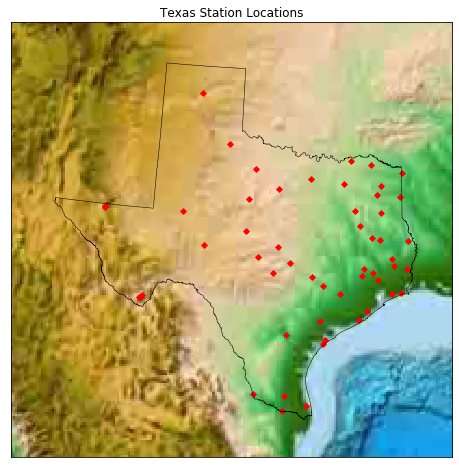

In [28]:

texas_df, texas_inv_df = get_station_data_by_state(gistemp_df, gistemp_inv_df, 'texas')

texas_lat, texas_lon = get_station_locations(texas_inv_df)

plot_gps_locations_texas(texas_lat, texas_lon)



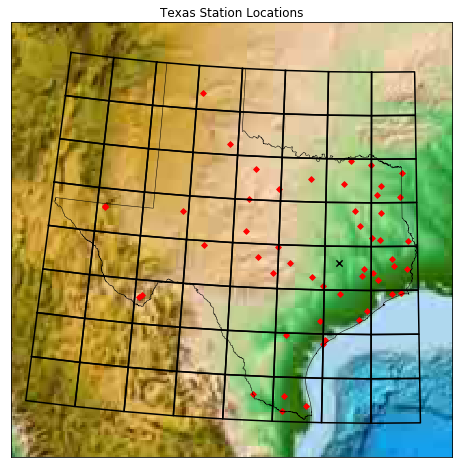

In [29]:

college_station_texas = (30.601389, -96.314445) # (lat, lon)

texas_boxes = create_texas_grid()

plot_gps_locations_texas(texas_lat, texas_lon, boxes=texas_boxes, marker_location=college_station_texas)



In [32]:

month = 'August'
year = 2010

try:
    local_mean_temp = optimize_location_mean_pwc(texas_df, 
                                                 texas_inv_df, 
                                                 eval_location=college_station_texas, 
                                                 year=year, 
                                                 month=month, 
                                                 boxes=texas_boxes, 
                                                 verbose=True)
except:
    print('Optimization Failed')
else:    
    if month is None:
        print(f'College Station Temperature in {year} : {local_mean_temp} °C')
    else:
        print(f'College Station Temperature in {month} {year} : {local_mean_temp} °C')




Parameter OutputFlag unchanged
   Value: 1  Min: 0  Max: 1  Default: 1
Changed value of parameter QCPDual to 1
   Prev: 0  Min: 0  Max: 1  Default: 0
Gurobi Optimizer version 9.0.2 build v9.0.2rc0 (win64)
Optimize a model with 121 rows, 97 columns and 289 nonzeros
Model fingerprint: 0x3eae0f5c
Coefficient statistics:
  Matrix range     [1e+00, 1e+00]
  Objective range  [1e+00, 1e+00]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 1e+00]
Presolve removed 121 rows and 97 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  1.000000000e+00
College Station Temperature in August 2010 : 30.44 °C
